<a href="https://colab.research.google.com/github/esperonj/Equipo26/blob/main/Avance4_26Equipo_MODELOS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Maestría en Inteligencia Artificial Aplicada**
## Proyecto Integrador (Gpo 26)

   ### Tecnológico de Monterrey
   ### Avance 4 - Modelos Alternativos

### *Automatización del Registro de Materiales Médicos mediante Visión Computacional*
### EQUIPO 26

###Luis Fernando Rojas Marta - A00757351
###Jose Eduardo Carreon - A01372413

In [1]:
!pip install ultralytics
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [2]:
# Montar Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Rutas Modelos Guardados

In [3]:
# Rutas a tus modelos best.pt
rutas_modelos = {
    'YOLOv8n30E': '/content/drive/MyDrive/YOLOv8_resultados/train/weights/best.pt', #direccion revisada ok
    'YOLOv8n50E': '/content/drive/MyDrive/YOLOv8_resultados50EPOCH/train/weights/best.pt', #direccion revisada ok
    'YOLOv8n100E': '/content/drive/MyDrive/YOLOv8_resultados100E/train2/weights/best.pt', #direccion revisada ok
    'YOLOv8s50e': '/content/drive/MyDrive/YOLOv8S_50Eresultados/train3/train3/weights/best.pt', #direccion revisada ok
    'YOLOv8m50e': '/content/drive/MyDrive/YOLOv8M_50Eresultados/train3/train/weights/best.pt', #direccion revisada ok
    'YOLOv8l50e': '/content/drive/MyDrive/YOLOv8S_50Eresultados/train3/train3/weights/best.pt', #direccion revisada ok
}

modelos = {nombre: YOLO(ruta) for nombre, ruta in rutas_modelos.items()}

#Rutas Gráficas de Entrenamiento

In [4]:
rutas_graficas = {
    'YOLOv8n30E': '/content/drive/MyDrive/YOLOv8_resultados/train', #direccion revisada ok
    'YOLOv8n50E': '/content/drive/MyDrive/YOLOv8_resultados50EPOCH/train', #direccion revisada ok
    'YOLOv8n100E': '/content/drive/MyDrive/YOLOv8_resultados100E/train2', #direccion revisada ok
    'YOLOv8s50e': '/content/drive/MyDrive/YOLOv8S_50Eresultados/train3/train4', #direccion revisada ok
    'YOLOv8m50e': '/content/drive/MyDrive/YOLOv8M_50Eresultados/train3/train', #direccion revisada ok
    'YOLOv8l50e': '/content/drive/MyDrive/YOLOv8L_50Eresultados/train3/train', #direccion revisada ok
}

In [7]:
from IPython.display import Image, display
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def mostrar_grafica_grid(tipo_archivo, titulo_seccion):
    modelos = list(rutas_graficas.keys())
    rutas = [os.path.join(rutas_graficas[m], tipo_archivo) for m in modelos]

    modelos_validos = []
    imagenes = []

    for modelo, ruta in zip(modelos, rutas):
        if os.path.exists(ruta):
            img = mpimg.imread(ruta)
            modelos_validos.append(modelo)
            imagenes.append(img)

    if not imagenes:
        print(f"No se encontraron imágenes para {titulo_seccion}")
        return

    # Parámetros de visualización
    por_fila = 2
    filas = (len(imagenes) + por_fila - 1) // por_fila

    plt.figure(figsize=(10, 5 * filas))
    plt.suptitle(titulo_seccion, fontsize=20, weight='bold')

    for i, (img, modelo) in enumerate(zip(imagenes, modelos_validos)):
        plt.subplot(filas, por_fila, i + 1)
        plt.imshow(img)
        plt.title(modelo, fontsize=14)
        plt.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

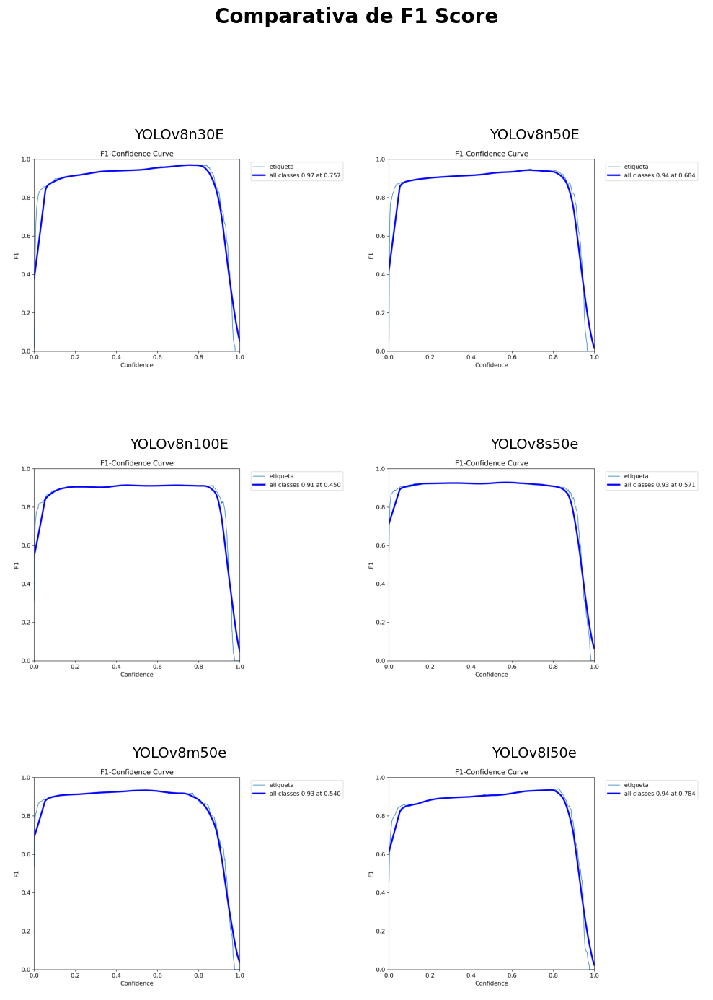

In [8]:
# F1 Curve
mostrar_grafica_grid('F1_curve.png', 'Comparativa de F1 Score')

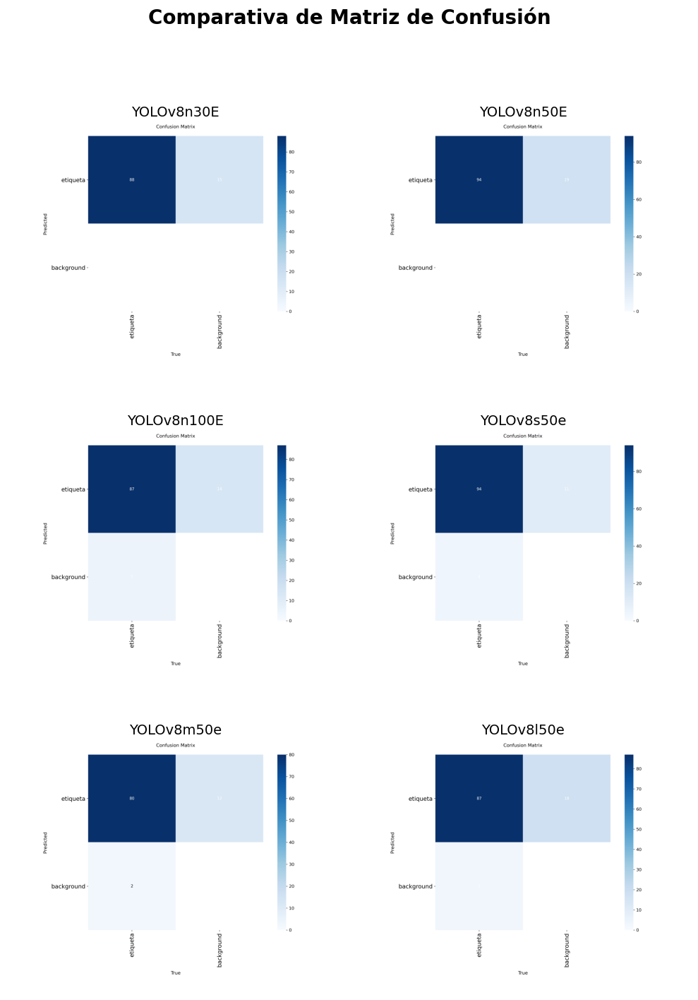

In [9]:
mostrar_grafica_grid('confusion_matrix.png', 'Comparativa de Matriz de Confusión')

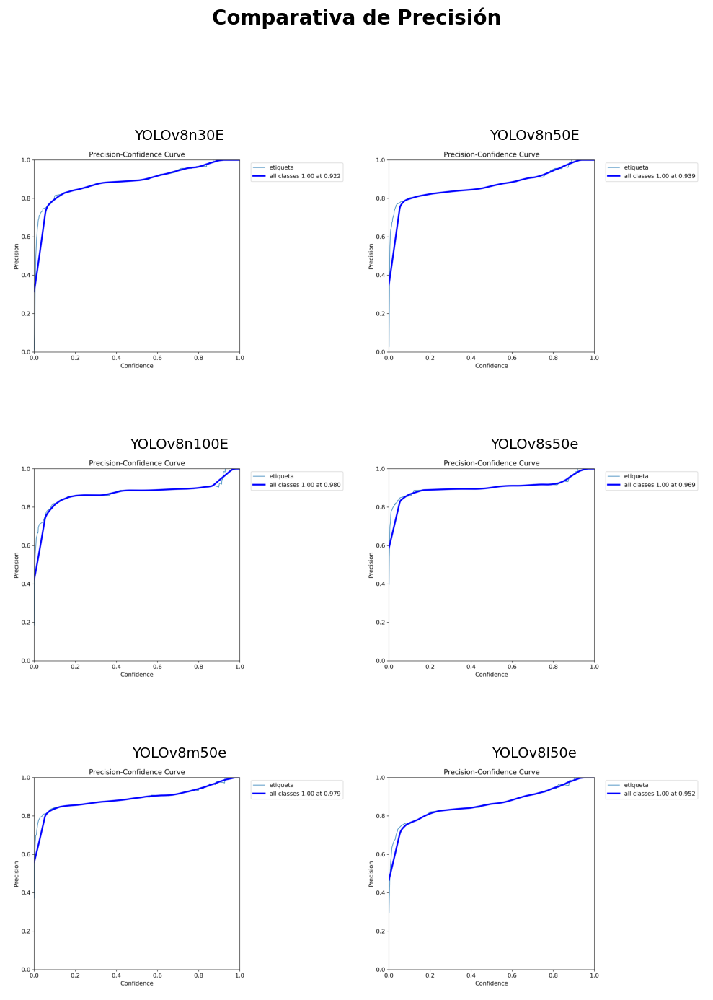

In [10]:
mostrar_grafica_grid('P_curve.png', 'Comparativa de Precisión')

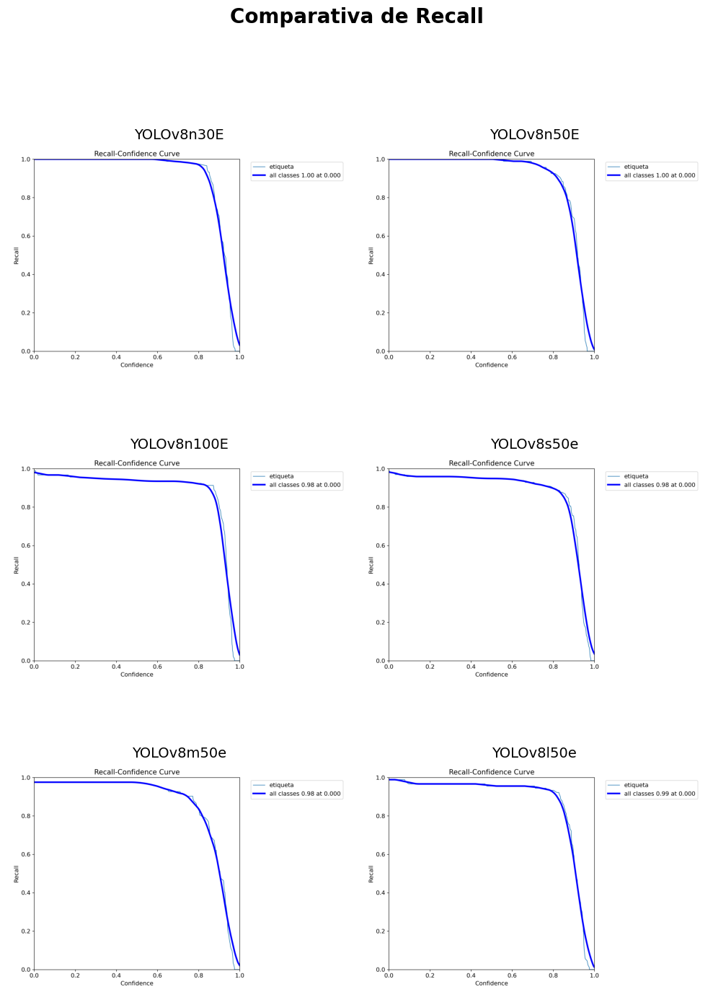

In [ ]:
mostrar_grafica_grid('R_curve.png', 'Comparativa de Recall')

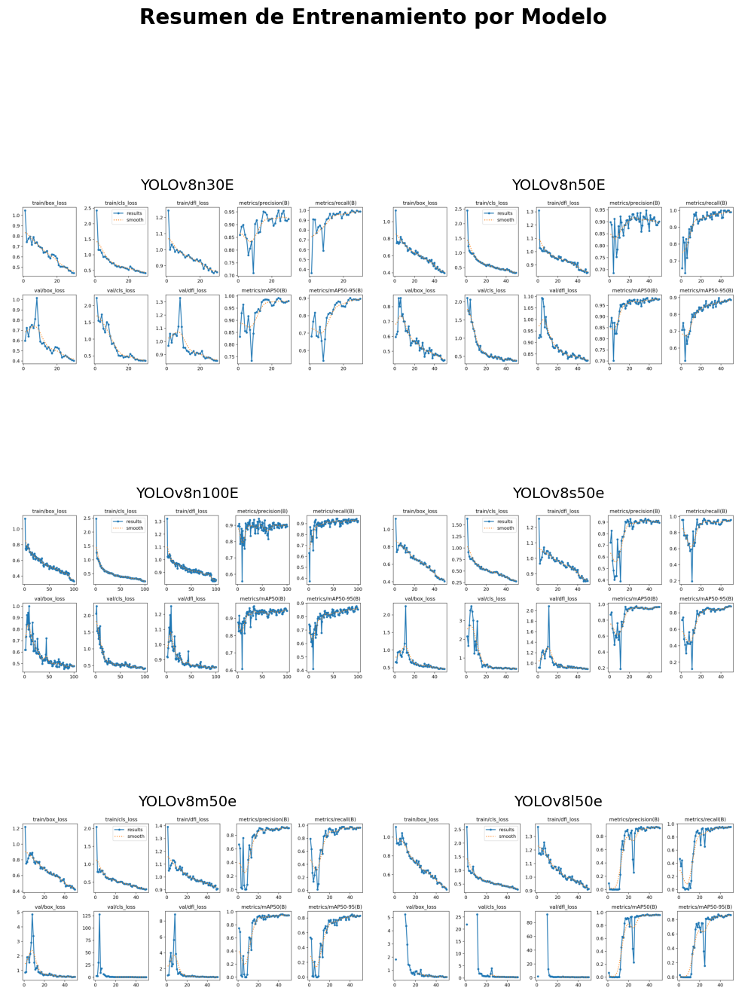

In [ ]:
mostrar_grafica_grid('results.png', 'Resumen de Entrenamiento por Modelo')

#Comparación de métricas

In [18]:
!pip install thop
from thop import profile
import torch
import pandas as pd

In [23]:
datos = []

# Entrada simulada para GFLOPs (1 imagen, 3 canales, 640x640)
input_sample = torch.randn(1, 3, 640, 640)

for nombre, ruta in rutas_modelos.items():
    modelo = YOLO(ruta)
    model = modelo.model.eval()

    # Parámetros
    total = sum(p.numel() for p in model.parameters())
    entrenables = sum(p.numel() for p in model.parameters() if p.requires_grad)
    capas = len(list(model.modules()))

    # GFLOPs
    macs, _ = profile(model, inputs=(input_sample,), verbose=False)
    gflops = macs / 1e9  # convierte de MACs a GFLOPs

    datos.append({
        'Modelo': nombre,
        'Capas': capas,
        'Parámetros totales': f"{total:,}",
        'Entrenables': f"{entrenables:,}",
        'GFLOPs (640x640)': round(gflops, 2)
    })

df_modelos = pd.DataFrame(datos)
df_modelos.set_index('Modelo', inplace=True)

# Mostrar tabla
from IPython.display import display
display(df_modelos)

,Capas,Parámetros totales,Entrenables,GFLOPs (640x640)
Modelo,,,,
YOLOv8n30E,225,"3,011,043",0,4.10
YOLOv8n50E,225,"3,011,043",0,4.10
YOLOv8n100E,225,"3,011,043",0,4.10
YOLOv8s50e,365,"43,630,611",0,82.70
YOLOv8m50e,295,"25,856,899",0,39.53
YOLOv8l50e,365,"43,630,611",0,82.70


In [22]:
# Diccionario con nombre del modelo y ruta a su results.csv
rutas_results = {
    'YOLOv8n30E': '/content/drive/MyDrive/YOLOv8_resultados/train/results.csv', #direccion revisada ok
    'YOLOv8n50E': '/content/drive/MyDrive/YOLOv8_resultados50EPOCH/train/results.csv', #direccion revisada ok
    'YOLOv8n100E': '/content/drive/MyDrive/YOLOv8_resultados100E/train2/results.csv', #direccion revisada ok
    'YOLOv8s50e': '/content/drive/MyDrive/YOLOv8S_50Eresultados/train3/train4/results.csv', #direccion revisada ok
    'YOLOv8m50e': '/content/drive/MyDrive/YOLOv8M_50Eresultados/train3/train/results.csv', #direccion revisada ok
    'YOLOv8l50e': '/content/drive/MyDrive/YOLOv8L_50Eresultados/train3/train/results.csv', #direccion revisada ok
}

# Consolidar métricas finales
metricas_modelos = []

for modelo, ruta in rutas_results.items():
    if os.path.exists(ruta):
        df = pd.read_csv(ruta)
        df.columns = df.columns.str.strip()
        ultima = df.iloc[-1]

        metricas_modelos.append({
            'Modelo': modelo,
            'Precision': round(ultima['metrics/precision(B)'], 3),
            'Recall': round(ultima['metrics/recall(B)'], 3),
            'mAP50': round(ultima['metrics/mAP50(B)'], 3),
            'mAP50-95': round(ultima['metrics/mAP50-95(B)'], 3),
            'Época final': int(ultima['epoch'])
        })
    else:
        print(f"⚠️ No se encontró: {ruta}")

# Crear tabla
df_metricas = pd.DataFrame(metricas_modelos)
df_metricas.set_index('Modelo', inplace=True)

# Mostrar en pantalla
from IPython.display import display
display(df_metricas)

# Opcional: guardar en Excel
#df_metricas.to_excel('/content/drive/MyDrive/YOLOv8/comparativa_metricas_models.xlsx')

,Precision,Recall,mAP50,mAP50-95,Época final
Modelo,,,,,
YOLOv8n30E,0.922,0.989,0.979,0.897,30
YOLOv8n50E,0.901,0.989,0.978,0.886,50
YOLOv8n100E,0.894,0.924,0.943,0.853,100
YOLOv8s50e,0.894,0.959,0.967,0.878,50
YOLOv8m50e,0.904,0.963,0.946,0.830,50
YOLOv8l50e,0.924,0.956,0.963,0.864,50


Al comparar el rendimiento cualitativo con la arquitectura técnica de los modelos YOLOv8 evaluados, se observa una tendencia interesante: mayor complejidad no siempre se traduce en mejor desempeño práctico.

Los modelos YOLOv8n (entrenados a 30, 50 y 100 épocas) presentan la menor complejidad computacional, con solo 225 capas, poco más de 3 millones de parámetros y 4.10 GFLOPs. A pesar de ser los modelos más ligeros, YOLOv8n30E logró las mejores métricas cualitativas, mostrando alta precisión en las detecciones y bajo número de falsos positivos. En este caso, entrenar más allá de 30 épocas no generó mejoras sustanciales, e incluso degradó ligeramente el desempeño.

Por otro lado, modelos como YOLOv8s, v8m y v8l tienen arquitecturas mucho más robustas: hasta 365 capas, más de 43 millones de parámetros y 82.7 GFLOPs, lo cual implica una carga computacional significativamente mayor. Sin embargo, esta complejidad no garantizó un rendimiento superior. De hecho, modelos como v8s50e y v8l50e presentaron comportamientos erráticos, generando múltiples falsos positivos al identificar zonas no etiquetadas como válidas.

El modelo YOLOv8m50e representó un punto medio interesante: con 295 capas y 39.5 GFLOPs, logró un balance entre precisión y cobertura, con buena detección y baja tasa de errores visuales, aunque sin superar a v8n30E en desempeño cualitativo.

En resumen:

- YOLOv8n30E ofrece el mejor rendimiento en relación a su tamaño, ideal para escenarios con recursos limitados o requerimientos de alta velocidad.

- Modelos más pesados como YOLOv8l o YOLOv8s pueden resultar excesivos si no van acompañados de un ajuste fino del entrenamiento.

Esto demuestra que, en algunos casos, menos es más, y que un modelo liviano pero bien entrenado puede superar a alternativas más complejas que no han sido igualmente optimizadas.

#Análisis Cualitativo

#####A continuación haremos que los 6 modelos distintos de YOLOv8 hagan predicciones sobre imágenes que no se usaron durante el entrenamiento ni validación de los modelos.

In [24]:
carpeta_val = '/content/drive/MyDrive/nuevas_imagenes'  # Ajusta la ruta a tus 96 imágenes

for nombre, modelo in modelos.items():
    output_folder = f'runs/detect/{nombre}_predict'
    print(f"→ Predicción con: {nombre}")
    modelo.predict(source=carpeta_val, save=True, project='runs/detect', name=f'{nombre}_predict', exist_ok=True)

→ Predicción con: YOLOv8n30E

image 1/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6183.JPG: 640x480 10 etiquetas, 73.3ms
image 2/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6184.JPG: 640x480 1 etiqueta, 71.3ms
image 3/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6185.JPG: 640x480 2 etiquetas, 66.4ms
image 4/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6186.JPG: 640x480 7 etiquetas, 74.3ms
image 5/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6187.JPG: 640x480 2 etiquetas, 68.9ms
image 6/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6188.JPG: 640x480 1 etiqueta, 68.8ms
image 7/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6189.JPG: 640x480 4 etiquetas, 69.4ms
image 8/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6190.JPG: 640x480 (no detections), 66.4ms
image 9/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6191.JPG: 640x480 5 etiquetas, 68.1ms
image 10/96 /content/drive/MyDrive/nuevas_imagenes/IMG_6192.JPG: 640x480 (no detections), 70.8ms
image 11/96 /content/drive/MyDrive/nuevas_


🔍 Resultados de YOLOv8n30E:


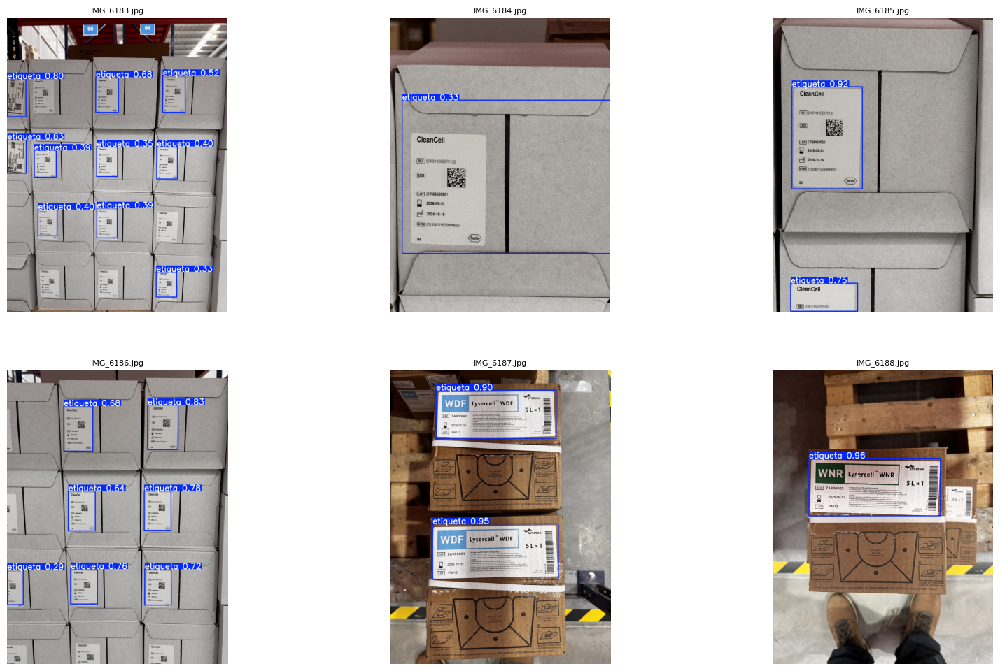


🔍 Resultados de YOLOv8n50E:


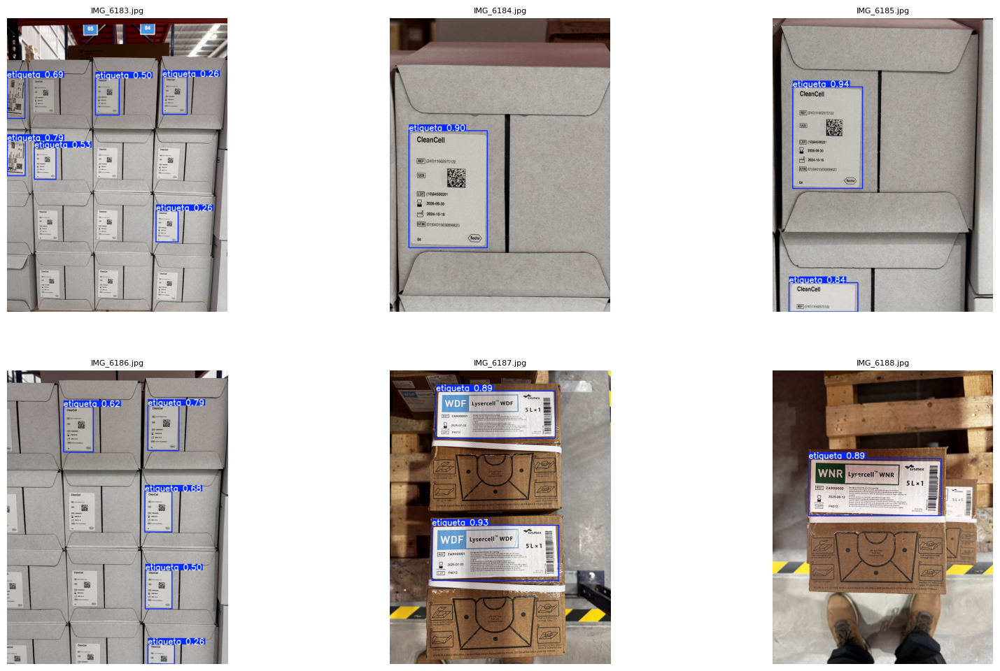


🔍 Resultados de YOLOv8n100E:


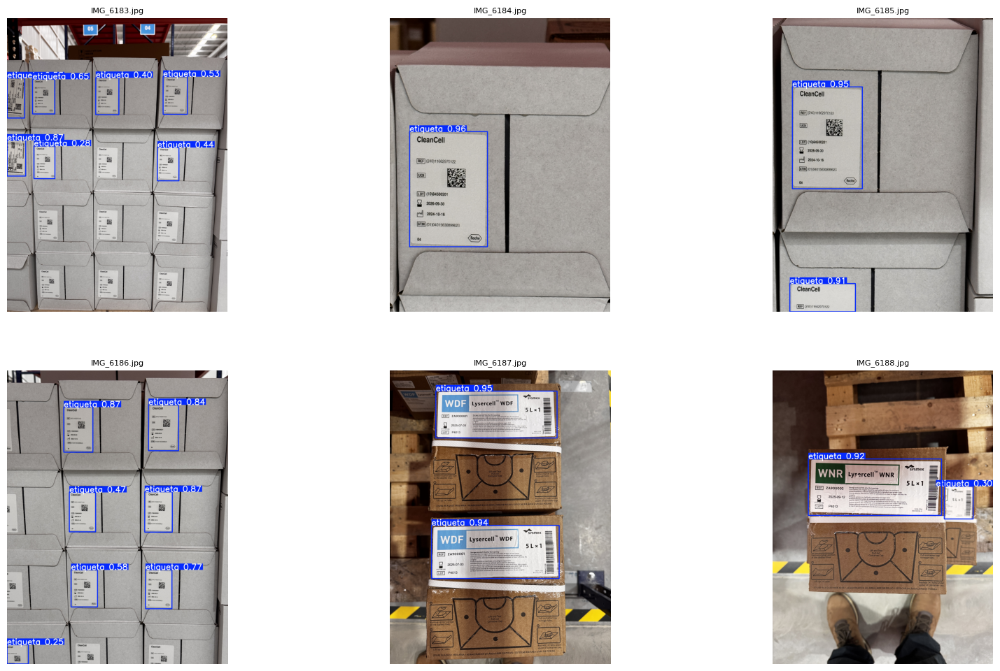


🔍 Resultados de YOLOv8s50e:


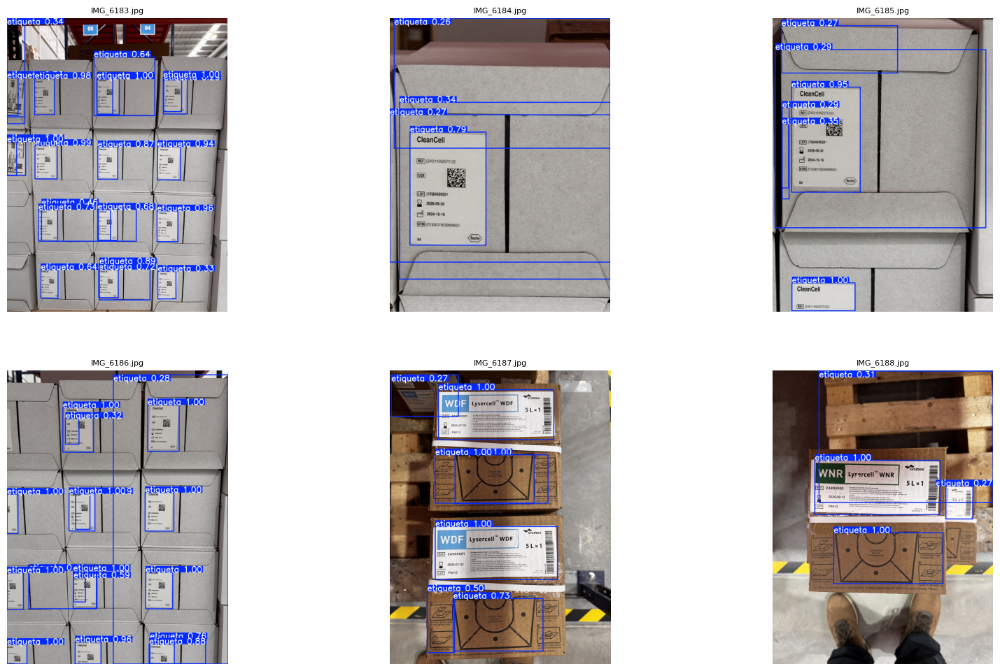


🔍 Resultados de YOLOv8m50e:


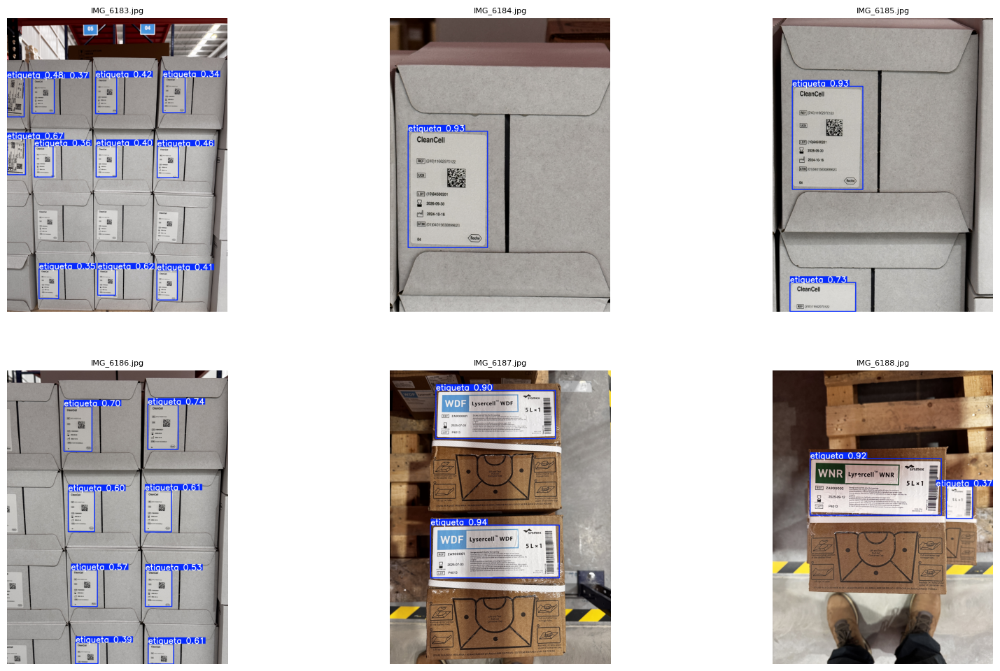


🔍 Resultados de YOLOv8l50e:


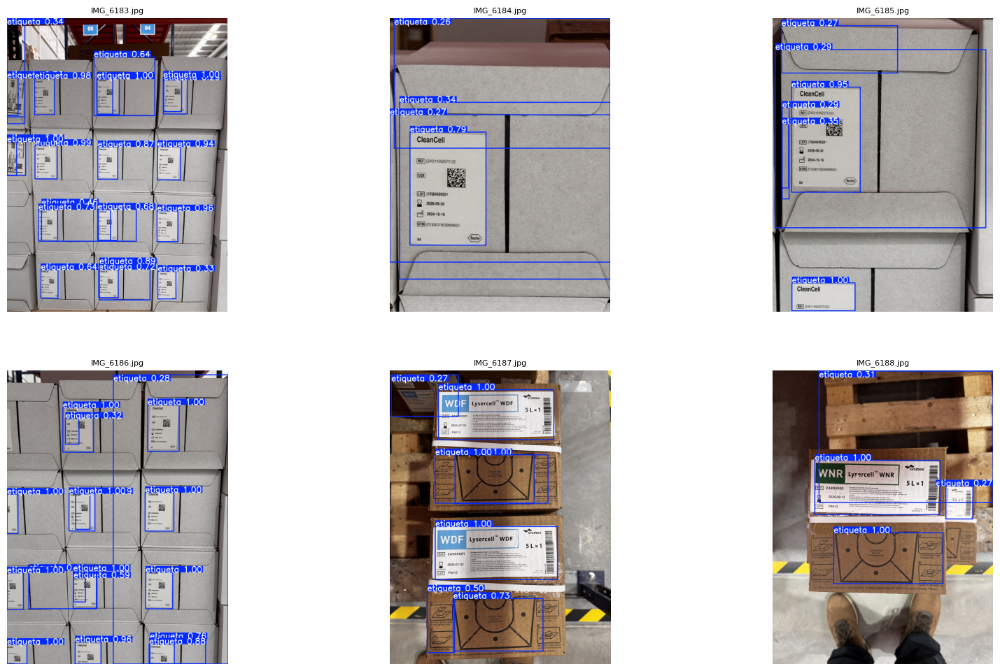

In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

for nombre in modelos.keys():
    ruta = f'runs/detect/{nombre}_predict'
    imagenes = sorted([f for f in os.listdir(ruta) if f.endswith(('.jpg', '.png'))])[:6]

    print(f"\n🔍 Resultados de {nombre}:")
    plt.figure(figsize=(20, 12))
    for i, img_file in enumerate(imagenes):
        img_path = os.path.join(ruta, img_file)
        img = mpimg.imread(img_path)
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(img_file, fontsize=8, loc='center')
    plt.show()

A partir de un análisis visual de las primeras seis imágenes inferidas por cada modelo, se identificaron comportamientos particulares que permiten evaluar su desempeño cualitativo, específicamente en cuanto a falsos positivos, falsos negativos, y la precisión espacial de las detecciones.

- YOLOv8n (30 épocas): presenta una ligera sobresegmentación en la imagen 2, donde la caja delimitadora abarca un área significativamente mayor que la región real de la etiqueta. Este comportamiento indica una posible falta de ajuste fino en la delimitación espacial. Aunque dentro de la revisión de las imágenes, todas tienen etiquetas, y este modelo identificó algunas de esas imáganes como que no había etiquetas.

- YOLOv8n (50 épocas): reduce el número de detecciones en comparación con su versión de 30 épocas, mostrando menor recall en las imágenes 1 y 4. Sin embargo, mejora la precisión en la imagen 2, lo cual sugiere un cambio en el umbral de confianza o una generalización distinta del conjunto de entrenamiento.

- YOLOv8n (100 épocas): mantiene un patrón de detección muy similar al modelo de 50 épocas, sin mejoras sustanciales. Esto puede indicar un estancamiento en el aprendizaje o incluso overfitting, sin beneficios claros de extender el entrenamiento.

- YOLOv8s (50 épocas): detecta todas las etiquetas correctamente, pero también presenta múltiples falsos positivos al marcar áreas sin etiquetas como verdaderos positivos. Este comportamiento puede atribuirse a una sensibilidad elevada del modelo o a un umbral de predicción bajo, generando un exceso de detecciones espurias.

- YOLOv8m (50 épocas): logra una detección precisa de casi todas las etiquetas, con mínima aparición de falsos positivos en el muestreo. El modelo mantiene una buena consistencia espacial y balance entre precisión y recall, sin sobresegmentaciones evidentes.

- YOLOv8l (50 épocas): muestra un desempeño similar al modelo v8s, en el sentido de que introduce múltiples detecciones incorrectas en zonas sin etiquetas. Esto podría deberse a una mayor capacidad del modelo que, al no estar suficientemente regularizada, sobreinterpreta patrones visuales irrelevantes.

En conjunto, los modelos que demostraron mejor desempeño cualitativo fueron:

- YOLOv8n (50 épocas): balance adecuado entre precisión y cobertura, con errores menores.

- YOLOv8m (50 épocas): robustez en la delimitación de etiquetas y bajo nivel de falsos positivos.